<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Gabriel Smith
    Section 2
    12/4/2018

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
import IPython
from matplotlib import pyplot as plt
from scipy.io import wavfile
from scipy import signal
import numpy as np
from scipy import fftpack
import time
import imageio

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        ## Save rates and samples for given SoundWave Class.
        self.rt = rate
        self.samp = samples
        return

    # Problems 1.1 and 1.7
    def plot(self,force=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        ## Calculate time by dividing # samples by the rate.
        val = len(self.samp)/self.rt
        
        ## Plot for if the force is false.
        if force==False:
            ## Calculate xs from time values
            xs = np.linspace(0,val,len(self.samp))
            
            ## Plot values according to time and samples.
            plt.plot(xs,self.samp)
            plt.title('Sound File Graph')
            plt.xlabel('Time (seconds)')
            plt.ylabel('Samples')
            
            ## Set ylim to sound barrier limits.
            plt.ylim([-32768,32768])
            plt.show()
        
        ## Plot for if the force is true.
        else:
            ## Calculate dft for given samples and calculate relative frequency
            dft = fftpack.fft(self.samp)
            freq = np.arange(len(dft))/len(dft)*self.rt
            
            ## Calculate time by dividing # samples by rate.
            xs = np.linspace(0,val,len(self.samp))
            
            ## Plot original sound by plotting time over samples.
            plt.subplot(121)
            plt.title('Sound File Graph')
            plt.plot(xs,self.samp)
            plt.xlabel('Time (Seconds)')
            plt.ylabel('Samples')
            ## Set ylim to sound barrier limits.
            plt.ylim((-32768,32767))
            
            ## Plot half of the DFT with given magnitudes and frequencies
            plt.subplot(122)
            plt.title('Discrete Fourier Transform Graph')
            plt.plot(freq[0:len(freq)//2],np.abs(dft[0:len(freq)//2]))
            ## Set specific axis labels.
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Magnitude')
            plt.show()
        return
        raise NotImplementedError("Problem 1.1 Incomplete")

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        ## Grab real values of samples.
        scaled = self.samp
        reals = np.real(self.samp)
        
        ## Scale samples if force is True or if dtype is not np.int16
        if force==True or self.samp.dtype != 'int16':
            scaled = np.int16(reals * 32767.0 / max(abs(reals)))
            
        ## Write rate and scaled values to new wavfile.
        wavfile.write(filename,self.rt,scaled)
        return
        raise NotImplementedError("Problem 1.2 Incomplete")
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        ## Raise ValueError if lengths of two samples are not the same.
        if len(self.samp) != len(other.samp):
            raise ValueError("Arrays do not have the same length.")
        
        ## Otherwise add both values together to make a chord.
        return SoundWave(self.rt,self.samp + other.samp)
        raise NotImplementedError("Problem 1.4 Incomplete")

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        ## Raise ValueError if rates of both samples are not the same.
        if self.rt != other.rt:
            raise ValueError("Arrays do not have the same rate.")
        
        ## Otherwise stack both samples on top of each other and return as a SoundWave object.
        comb = np.hstack((self.samp,other.samp))
        return SoundWave(self.rt,comb)
        raise NotImplementedError("Problem 1.4 Incomplete")
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        my_samps = self.samp
        other_samps = other.samp
        
        ## Raise ValueError if two Soundwaves have differing rates.
        if self.rt != other.rt:
            raise ValueError("Two sample rates are not equal.")
            
        ## If statement whether self Soundwave has more samples than other Soundwave.
        if len(self.samp) > len(other.samp):
            num = len(self.samp) - len(other.samp)
            padding = np.zeros(num)
            ## Concatenate zeros onto end of other_samps
            other_samps = np.hstack((other_samps, padding))
        
        ## If statement whether other Soundwave has more samples than self Soundwave.
        elif len(other.samp) > len(self.samp):
            num = len(other.samp) - len(self.samp)
            padding = np.zeros(num)
            ## Concatenate zeros onto end of my_samps
            my_samps = np.hstack((my_samps, padding))
        
        ## Compute convolution for given self and other Soundwaves.
        conv = fftpack.ifft(fftpack.fft(my_samps) * fftpack.fft(other_samps)).real
        return SoundWave(self.rt, conv)
        raise NotImplementedError("Problem 2.1 Incomplete")

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        ## Raise ValueError if self and other SoundWave have differing sample rates.
        if self.rt != other.rt:
            raise ValueError('The two sample rates are not equal.')
        
        ## Grab length of self and other samples then compute the closest 2**i value.
        n = len(self.samp)
        m = len(other.samp)
        i = 0
        while 2**i < n+m-1:
            i+=1
        
        ## Add zeros to both my_samps and other_samps arrays until length of n+m-1.
        pad1 = np.zeros(2**i-n)
        pad2 = np.zeros(2**i-m)
        my_samps = np.hstack((self.samp, pad1))
        other_samps = np.hstack((other.samp, pad2))
        
        ## Compute convulution of both values multiplied together, return them as a Soundwave object.
        conv = fftpack.ifft(fftpack.fft(my_samps)*fftpack.fft(other_samps)).real
        return SoundWave(self.rt,conv[0:(n+m-1)])
        raise NotImplementedError("Problem 2.2 Incomplete")

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        ## Compute k_low and k_high based off of k = v*n/r calculation
        k_low = int(low_freq*len(self.samp)/self.rt)
        k_high = int(high_freq*len(self.samp)/self.rt)
        n = len(self.samp)
        
        ## Compute dft of given noise, then set all values between k_low and k_high to 0, along
        ## with n-k_high and n-k_low values to 0 as well.
        dft = fftpack.fft(self.samp)
        dft[k_low:k_high] = 0
        dft[(n-k_high):(n-k_low)] = 0
        
        ## Compute the ifft with the new dft array and save that as the new self.samp
        self.samp = fftpack.ifft(dft).real
        return
        raise NotImplementedError("Problem 2.4 Incomplete")

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

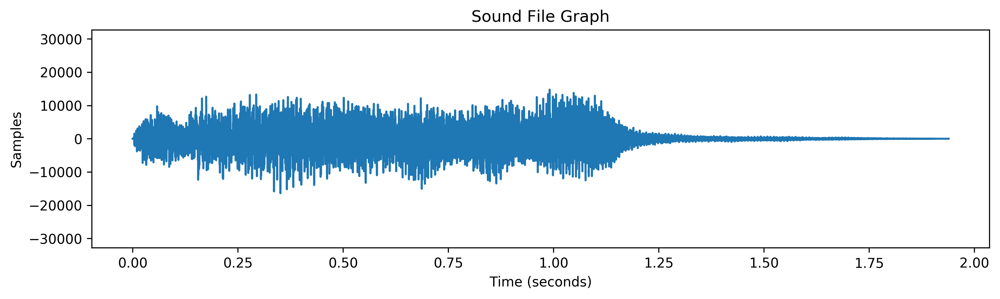

In [4]:
## Grab rates and samples from given wavfile then save values as a SoundWave class.
rates, samples = wavfile.read('tada.wav')
wave = SoundWave(rates,samples)

## Plot values of SoundWave class.
wave.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
## Display sound from tada.wave file
IPython.display.Audio(filename='tada.wav')

In [6]:
## Export tada.wav file as a new file without scaling and display sound.
wave.export('tada_noscale.wav')
IPython.display.Audio(filename='tada_noscale.wav')

In [7]:
## Export tada.wav file as a new file with scaling and display sound.
wave.export('tada_scale.wav',True)
IPython.display.Audio(filename='tada_scale.wav')

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [8]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    ## Create rate and given sample space for new sound.
    r = 44100
    xs = np.linspace(0,duration,duration*r)
    
    ## Using sin function to create specific sound from frequency value
    samps = np.sin(2*np.pi*xs*frequency)
    
    ## Put rate and sample results into new SoundWave class object then return the object.
    sound = SoundWave(r,samps)
    return sound
    raise NotImplementedError("Problem 1.3 Incomplete")

In [9]:
## Generate A note for 2 seconds and display sound.
sound = generate_note(440,2)
IPython.display.Audio(rate=sound.rt,data=sound.samp)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [10]:
## Create A, C and E notes using generate sound.
a = generate_note(440,3)
c = generate_note(523.25,3)
e = generate_note(659.25,3)

## Combine notes into one chord and display sound.
chord = a+c+e
IPython.display.Audio(rate = chord.rt,data=chord.samp)

In [11]:
## Create A, C and E notes using generate sound.
a = generate_note(440,1)
c = generate_note(523.25,1)
e = generate_note(659.25,1)

## Combine notes into one arpeggio and display sound.
arp = a >> c >> e
IPython.display.Audio(rate = arp.rt,data=arp.samp)

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    ## Grab length of samples then create array of aranged values.
    n = len(samples)    
    l = np.arange(n)
    
    ## Create matrix of all aranged values used in np.exp
    matrix = np.reshape(l,(n,1)) * np.reshape(l,(1,n))
    
    ## Compute fourier transformation for given samples and return results.
    exp = (samples * np.exp(-2*np.pi*matrix*1j/n)).sum(axis=1)/n
    return exp
    raise NotImplementedError("Problem 1.5 Incomplete")

In [13]:
## For loop computing dft using above function for random lengths and values of x.
for i in range(6,20):
    ## Create array of i random values.
    vals = np.random.random(i)
    
    ## Compute dft using simple_dft and scipy.fftpack.fft then compare results against each other.
    dft1 = simple_dft(vals)
    dft2 = fftpack.fft(vals)
    print(np.allclose(dft1*i,dft2))

True
True
True
True
True
True
True
True
True
True
True
True
True
True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    ## Recursive function to find DFT.
    def split(g):
        n = len(g)
        ## If n equals the defined threshold input in the function.
        if n <= threshold:
            ## Use the defined dft function from previously to compute dft.
            return n*simple_dft(g)
        ## Otherwise, split values into different pieces
        else:
            ## Split g samples into even and odd values.
            even = split(g[::2])
            odd = split(g[1::2])
            
            ## Compute exponential components of entire length.
            z = np.exp(-2*np.pi*1j*np.arange(n)/n)
            m = n//2
            
            ## Return stacked values of first half of z and second half of z.
            return np.hstack((even+z[:m]*odd,even+z[m:]*odd))
    ## Start recursive function to find dft of given samples.
    return split(samples)/len(samples)
    raise NotImplementedError("Problem 1.6 Incomplete")

In [15]:
## Compute dft for above function of random values.
n = 2**np.arange(8)
for i in n:
    ## Create random sample of i values.
    samples = np.random.random(i)
    
    ## Calculate dft using simple_fft and scipy.fftpack.fft then compare results.
    dft1 = simple_fft(samples)
    dft2 = fftpack.fft(samples)
    print(np.allclose(dft1*len(samples),dft2))

True
True
True
True
True
True
True
True


In [16]:
## Time function computation of each of the dft calculating functions.
ns = np.random.random(8192)
%time simple_dft(ns)
%time simple_fft(ns)
%time fftpack.fft(ns)

CPU times: user 4.57 s, sys: 3.81 s, total: 8.38 s
Wall time: 10.8 s
CPU times: user 541 ms, sys: 22.5 ms, total: 564 ms
Wall time: 723 ms
CPU times: user 300 µs, sys: 297 µs, total: 597 µs
Wall time: 576 µs


array([ 4084.81950501 +0.j        ,    10.61749633-10.57679854j,
          -8.66086926+14.16195608j, ...,    -8.56768217 -9.36955274j,
          -8.66086926-14.16195608j,    10.61749633+10.57679854j])

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

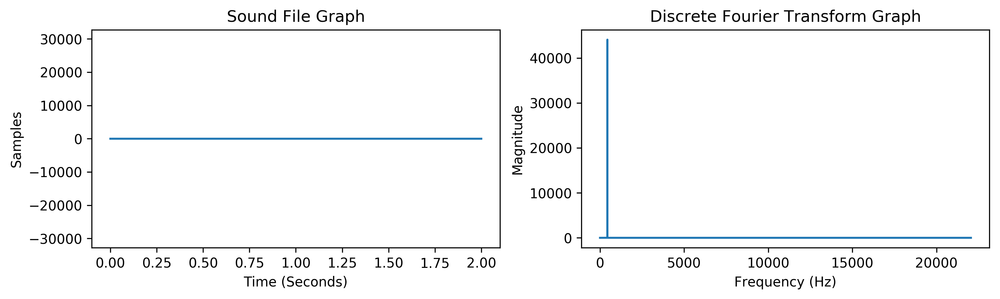

In [17]:
## Create an A note then plot its regular sound and its dft.
a = generate_note(440,2)
a.plot(True)

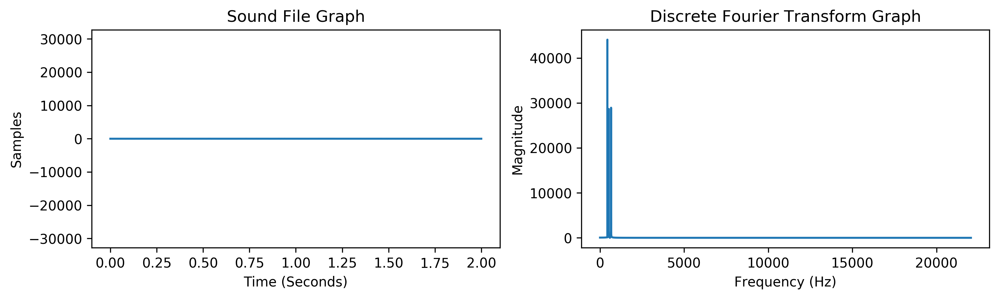

In [18]:
## Generate A, C and E notes and create them into one chord.
a = generate_note(440,2)
c = generate_note(523.25,2)
e = generate_note(659.25,2)
a_min_chord = a + c + e

## Plot samples of chord including its dft.
a_min_chord.plot(True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [19]:
## Grab random notes rate and samples then create them into a new SoundWave object.
mrates, msamples = wavfile.read('mystery_chord.wav')
mnote = SoundWave(mrates,msamples)

## Calculate the dft of given random note.
dft = np.abs(fftpack.fft(msamples))

## Calculate the frequency, then take the largest 3 values from the dft.
freq = np.arange(len(dft))/len(dft) * mrates
inds = np.argsort(dft[0:len(freq)//2])[-3:]

## Keep only indices of 3 largest sounds found in above calculation.
sounds = freq[inds]

FileNotFoundError: [Errno 2] No such file or directory: 'mystery_chord.wav'

In [ ]:
## Display the 3 largest sounds found in above calculation.
sounds

The notes are...

C, G and A.

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [20]:
rate, samples = wavfile.read('tada.wav')
tada = SoundWave(rate,samples)
white_noise = SoundWave(rate,np.random.randint(-32767,32767,rate*2,dtype=np.int16))
my_noise = tada*white_noise
print(white_noise.rt)
my_noise = my_noise >> my_noise
IPython.display.Audio(rate=my_noise.rt,data=my_noise.samp)

22050


### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [24]:
## Compute samples and rates for CGC.wav and GCG.wav files and store them as SoundWave objects.
crates, csamples = wavfile.read('CGC.wav')
cgc = SoundWave(crates, csamples)
grates, gsamples = wavfile.read('GCG.wav')
gcg = SoundWave(grates, gsamples)

## Time their linear convolution using SoundWave.__pow__() and scipy.signal.fftconvole()
%time new_snd1 = cgc**gcg
%time defined_samps = signal.fftconvolve(csamples,gsamples)

CPU times: user 90 ms, sys: 20.6 ms, total: 111 ms
Wall time: 111 ms
CPU times: user 29.9 ms, sys: 5.76 ms, total: 35.6 ms
Wall time: 35.9 ms


In [25]:
## Embed convolution from SoundWave.__pow__()
IPython.display.Audio(rate = new_snd1.rt, data = new_snd1.samp)

In [26]:
## Embed convolution from regular sample rate and actual sampls from scipy.signal.fftconvole()
IPython.display.Audio(rate=crates,data=defined_samps)

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [27]:
## Create SoundWave objects for both chopin.wav and balloon.wav
crate, csamp = wavfile.read('chopin.wav')
chopin = SoundWave(crate,csamp)
brate, bsamp = wavfile.read('balloon.wav')
balloon = SoundWave(brate, bsamp)

## Compute their linear convolution
new_snd = chopin**balloon

## Embed chopin.wav sound object in notebook
IPython.display.Audio(rate=chopin.rt,data=chopin.samp)

In [28]:
## Embed balloon.wav sound object in notebook
IPython.display.Audio(rate=balloon.rt,data=balloon.samp)

In [29]:
## Embed chopin and balloon linear convolution in notebook
IPython.display.Audio(rate=new_snd.rt,data=new_snd.samp)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [30]:
## Compute original sound versions of noisy1 and noise2 wavfiles and save them as SoundWave objects.
n1rates, n1samples = wavfile.read('noisy1.wav')
noisy1 = SoundWave(n1rates,n1samples)
n2rates, n2samples = wavfile.read('noisy2.wav')
noisy2 = SoundWave(n2rates,n2samples)

## Embed noisy1 original version in notebook.
IPython.display.Audio(rate=noisy1.rt,data=noisy1.samp)

In [31]:
## Clean noisy1 original sound then embed the new sound in notebook.
noisy1.clean(1250,2600)
IPython.display.Audio(rate=noisy1.rt,data=noisy1.samp)

In [32]:
## Embed noisy2 original version in notebook.
IPython.display.Audio(rate=noisy2.rt,data=noisy2.samp)

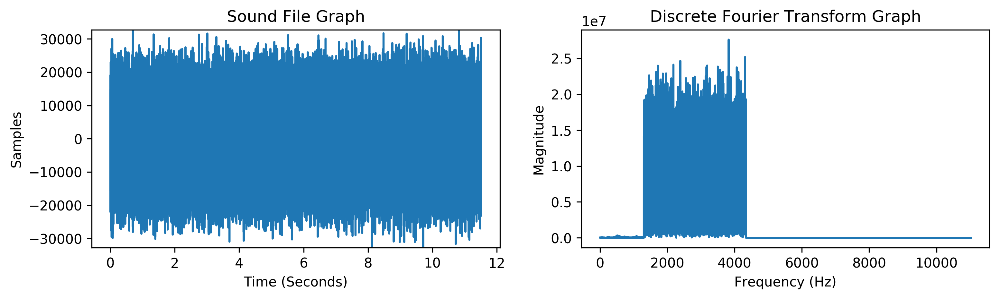

In [33]:
## Plot of noisy2 with its dft to understand noise levels.
noisy2.plot(force=True)

In [34]:
## Determining from the above graph, I chose to clean between 1300 and 4400 from the dft graph.
noisy2.clean(1300,4400)

## Embed cleaned noise in the notebook.
IPython.display.Audio(rate=noisy2.rt,data=noisy2.samp)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [35]:
## Grab vuvuzela rate and sample and save the left and right channels as SoundWave objects
vrate, vsamp = wavfile.read('vuvuzela.wav')
vu_left = SoundWave(vrate,vsamp[:,0])
vu_right = SoundWave(vrate,vsamp[:,1])

## Clean both the right and left channels between 200 and 500 then recombine the samples into a new sound.
vu_left.clean(200,500)
vu_right.clean(200,500)
vuvu = np.vstack((vu_left.samp,vu_right.samp))

In [36]:
## Embed original sound into notebook.
IPython.display.Audio(rate=vrate,data=vsamp.T)

In [37]:
## Embed cleaned version into notebook.
IPython.display.Audio(rate=vrate,data=vuvu)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

In [38]:
## Download the license_plate.png image and perform the fast fourier transform.
im = imageio.imread('license_plate.png')
fft2 = fftpack.fft2(im)

## Plot the fast fourier transform of the image.
plt.imshow(np.log(np.abs(fft2)),cmap='gray')
plt.show()

FileNotFoundError: No such file: '/Users/coryglover/Documents/byu_vol2-Instructor-Materials/GabeSmith/FourierTransform/license_plate.png'

In [39]:
## Grab all values of the dft object above 12 and replace them with the mean of the dft.
mask = np.log(np.abs(fft2)) > 12
fft2[mask] = np.mean(fft2)

## Plot the new dft image.
plt.imshow(np.log(np.abs(fft2)),cmap='gray')
plt.show()

NameError: name 'fft2' is not defined

In [40]:
## Compute the inverse fft and set that equal to the new image, and plot the new image.
new_im = fftpack.ifft2(fft2).real
plt.imshow(new_im,cmap='gray')
plt.show()

NameError: name 'fft2' is not defined

The year on the sticker is... 13